## Feature Visualization Video Demo notebook

In [1]:
%load_ext autoreload
%autoreload 2

#### feature target 

In [2]:
#hardware
device = 'cuda:0'

from circuit_pruner.utils import load_config

config = load_config('./configs/alexnet_sparse_config.py')
model = config.model.to(device)



#general
import torch
import os
from copy import deepcopy


/home/chris/miniconda3/envs/viscnn/lib/python3.7/site-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla K40c with CUDA capability sm_35 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the Tesla K40c GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


In [3]:
#circle feature
layer = 'features_6'
unit = 305

feature_targets = {layer:[unit]}

100%|██████████| 100/100 [00:04<00:00, 21.82it/s]



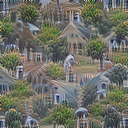

final loss: -4172.288


In [4]:
from lucent_video.optvis import render, param, transform, objectives
from lucent.modelzoo import inceptionv1
import torch



device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = inceptionv1(pretrained=True)
_ = model.to(device).eval()

#obj = layer+':'+str(unit)
obj = objectives.channel('mixed4a',475)
_ = render.render_vis(model, obj, show_inline=True, thresholds = (100,),device = device)

In [6]:
layers = dict([*model.named_modules()])

In [7]:
from lucent_video.optvis import render, param, transform, objectives
from PIL import Image
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names
from circuit_pruner.force import mask_from_sparsity, expand_structured_mask, apply_mask
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names
from collections import OrderedDict

import numpy as np
from math import ceil,exp,log



def gen_feature_viz_video(model,ranks,layer,unit,
                          sparsities = None,sparsity_range = (.001,.6), frames=200,
                          scheduler='linear',connected=True,opt_steps=50,lr = 5e-2,size=224,
                          desaturation=10,file_name=None,save=True, negatives=False, include_full= True,random_mask=False):
    if negatives:
        batch_size=4
        obj = objectives.channel(layer, unit, batch=0) + objectives.neuron(layer, unit, batch=1) - objectives.channel(layer, unit, batch=2) - objectives.neuron(layer, unit, batch=3)
    else:
        batch_size=2
        obj = objectives.channel(layer, unit, batch=0) + objectives.neuron(layer, unit, batch=1)
    setup_net_for_circuit_prune(model)
    image_list = []
    params = None
    opt = lambda params: torch.optim.Adam(params, lr)
    
    
    
    nonzero_ranks = 0 
    for r in ranks:
        nonzero_ranks += torch.sum((r != 0).int())
    ks = []
    
    
    if sparsities is None:
        if scheduler == 'exp':

            max_k = int(nonzero_ranks*sparsity_range[1])
            min_k = int(nonzero_ranks*sparsity_range[0])
            for t in range(0,frames+1):
                k = ceil(exp(t/frames*log(min_k)+(1-t/frames)*log(max_k))) #exponential schedulr
                ks.insert(0, k) 
            ks = list(OrderedDict.fromkeys(ks))
        else:
            sparsities = np.linspace(sparsity_range[0],sparsity_range[1],frames)
            for sparsity in sparsities:
                ks.append(int(nonzero_ranks*sparsity))
    else:
        for sparsity in sparsities:
            ks.append(int(nonzero_ranks*sparsity))
            
    #include_full
    if include_full and ks[-1] < nonzero_ranks:
        ks.append(nonzero_ranks)
        

    if random_mask:
        random_ranks = []
        for g in ranks:
            random_ranks.append(torch.rand(g.shape))
        ranks = random_ranks 
        
        
    print(ks)
    for k in ks:
        print(k)
        mask,cum_sal = mask_from_sparsity(ranks,k)
        expanded_mask = expand_structured_mask(mask,model)
        apply_mask(model,expanded_mask)
        if connected:
            if params is not None:
                params = params.requires_grad_(False)
                ##add noise
                #param_noise, _ = param.fft_image((1, 3, size, size),sd=.01)
                #param_noise = param_noise[0].requires_grad_(False)
                #params = param_noise+params
                
                #desaturate
                params = (params-torch.mean(params))/torch.std(params)*.05
                
                
                ##remove high frequency 
                #params[:,:,:,10:,:] = 0
                
                params = params.requires_grad_(True)
                

            param_f = lambda: param.image(size,start_params=params,magic=desaturation,batch=batch_size)
        else:
            param_f = lambda: param.image(size,batch=batch_size)
        output = render.render_vis(model, obj, param_f, opt, show_inline=True, thresholds=(opt_steps,))
        image,params = output['images'],output['params']
        image_list.append(image[0])
        
        #include full
        if include_full and (k ==ks[-1]):
            for _ in range(5):
                image_list.append(image[0])
        
        
    
    if save:
        #reshape
        gif = []
        for i in range(len(image_list)):
            im = image_list[i]
            if im.shape[0] > 1:
                im_reshape = np.concatenate(tuple(im),axis=1)
            else: im_reshape = im
                
            gif.append(Image.fromarray(np.uint8(im_reshape*255)))

        if file_name is None:
            connected_name = ''
            if connected:
                connected_name = 'connected'
                file_name = '%s_%s_%s_paint.gif'%(layer,unit,connected_name)

        print('saving gif to %s'%file_name)
        gif[0].save(file_name, save_all=True,optimize=False, append_images=gif[1:], loop=0)
    
    return image_list

{'': InceptionV1(
   (conv2d0_pre_relu_conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2))
   (conv2d1_pre_relu_conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
   (conv2d2_pre_relu_conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1))
   (mixed3a_1x1_pre_relu_conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1))
   (mixed3a_3x3_bottleneck_pre_relu_conv): Conv2d(192, 96, kernel_size=(1, 1), stride=(1, 1))
   (mixed3a_5x5_bottleneck_pre_relu_conv): Conv2d(192, 16, kernel_size=(1, 1), stride=(1, 1))
   (mixed3a_pool_reduce_pre_relu_conv): Conv2d(192, 32, kernel_size=(1, 1), stride=(1, 1))
   (mixed3a_3x3_pre_relu_conv): Conv2d(96, 128, kernel_size=(3, 3), stride=(1, 1))
   (mixed3a_5x5_pre_relu_conv): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1))
   (mixed3b_1x1_pre_relu_conv): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1))
   (mixed3b_3x3_bottleneck_pre_relu_conv): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1))
   (mixed3b_5x5_bottleneck_pre_relu_conv):

#### ranks

In [4]:
#general_ranks = torch.load('quick_start/features_8_53_alexnetsparse_actgrad_ranks.pt')
ranks_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner/circuit_ranks/alexnet_sparse/imagenet_2/actxgrad/'
general_ranks = torch.load(ranks_folder+'alexnet_sparse_features_6:305_1640670785.5266242.pt')
from circuit_pruner.ranks import rankdict_2_ranklist
general_ranks = rankdict_2_ranklist(general_ranks)

In [14]:
general_ranks[0].shape


x = torch.rand(general_ranks[0].shape)

In [15]:
x.shape

torch.Size([64, 3])

In [8]:
import pickle
#df = pickle.load(open('quick_start/dist_df.pkl','rb'))
df = pickle.load(open('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner/extracted_circuits/circuit_with_force_and_mag_df.pkl','rb'))

In [9]:
df.loc[(df['model']=='alexnet_sparse') & (df['layer']==layer) & (df['method']=='actxgrad') & (df['unit']==unit)][['sparsity','effective_sparsity','pruned_pearson']]

,sparsity,effective_sparsity,pruned_pearson
37289,0.001,0.000000,0.000000
37290,0.005,0.000000,0.000000
37291,0.010,0.002683,0.583387
37292,0.050,0.042456,0.935519
37293,0.100,0.094697,0.980296
37294,0.200,0.199100,0.995835
37295,0.300,0.299321,0.999076
37296,0.400,0.398674,0.999909
37297,0.500,0.496449,0.999999
37298,0.600,0.598564,1.000000


#### sparsity

In [ ]:
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names
setup_net_for_circuit_prune(model)

In [ ]:
sparsity = .01

In [ ]:
nonzero_ranks = 0 

for r in general_ranks:
    nonzero_ranks += torch.sum((r != 0).int())
    

In [ ]:
k = int(nonzero_ranks*sparsity)
k

#### mask

In [ ]:
from circuit_pruner.force import mask_from_sparsity, expand_structured_mask, apply_mask

mask,cum_sal = mask_from_sparsity(general_ranks,k)
expanded_mask = expand_structured_mask(mask,model)
apply_mask(model,expanded_mask)

### visualization

In [10]:
import numpy as np

sparsities = np.linspace(.01,.05, 50)

In [ ]:
from lucent_video.optvis import render, param, transform, objectives


In [ ]:
obj_c = objectives.channel(layer, unit)
obj_n = objectives.neuron(layer,  unit)

In [ ]:
obj_c.description.replace(' ','_').replace('[','').replace(']','').replace(',','')

In [ ]:
from lucent_video.optvis import render, param, transform, objectives

#param_f = lambda: param.image(size)

total_viz_steps = 50
within_viz_steps = 10

image_list = []
params = None
for i in range(len(sparsities)):
    sparsity = sparsities[i]
    nonzero_ranks = 0 
    for r in general_ranks:
        nonzero_ranks += torch.sum((r != 0).int())
    k = int(nonzero_ranks*sparsity)
    mask,cum_sal = mask_from_sparsity(general_ranks,k)
    expanded_mask = expand_structured_mask(mask,model)
    apply_mask(model,expanded_mask)
    
    param_f = lambda: param.image(224,start_params=params,magic=10)
    #param_f = lambda: param.image(224)
    image,params = render.render_vis(model, obj_c, param_f, show_inline=True, thresholds=(total_viz_steps,))
    image_list.append(image)



In [ ]:
from math import ceil,exp,log,e
import numpy as np

sparsity_range = (.001,.6)

frames = 200

base=1.2

ks = []
max_k = int(nonzero_ranks*sparsity_range[1])
min_k = int(nonzero_ranks*sparsity_range[0])
for t in range(0,frames+1):
    k = ceil(base**(t/frames*log(min_k,base)+(1-t/frames)*log(max_k,base))) #exponential schedulr
    ks.insert(0, k) 
    
ks2 = []   
sparsities = np.linspace(sparsity_range[0],sparsity_range[1],frames)
for sparsity in sparsities:
    ks2.append(int(nonzero_ranks*sparsity))

In [ ]:
ks

In [ ]:
max_k

In [ ]:
ks2

#### start here

In [2]:
from lucent_video.optvis import render, param, transform, objectives
from PIL import Image
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names
from circuit_pruner.force import mask_from_sparsity, expand_structured_mask, apply_mask
from circuit_pruner.force import setup_net_for_circuit_prune, show_model_layer_names
from collections import OrderedDict

import numpy as np
from math import ceil,exp,log



def gen_feature_viz_video(model,ranks,layer,unit,
                          sparsities = None,sparsity_range = (.001,.6), frames=200,
                          scheduler='linear',connected=True,opt_steps=50,lr = 5e-2,size=224,
                          desaturation=10,file_name=None,save=True, negatives=False, include_full= True,random_mask=False):
    if negatives:
        batch_size=4
        obj = objectives.channel(layer, unit, batch=0) + objectives.neuron(layer, unit, batch=1) - objectives.channel(layer, unit, batch=2) - objectives.neuron(layer, unit, batch=3)
    else:
        batch_size=2
        obj = objectives.channel(layer, unit, batch=0) + objectives.neuron(layer, unit, batch=1)
    setup_net_for_circuit_prune(model)
    image_list = []
    params = None
    opt = lambda params: torch.optim.Adam(params, lr)
    
    
    
    nonzero_ranks = 0 
    for r in ranks:
        nonzero_ranks += torch.sum((r != 0).int())
    ks = []
    
    
    if sparsities is None:
        if scheduler == 'exp':

            max_k = int(nonzero_ranks*sparsity_range[1])
            min_k = int(nonzero_ranks*sparsity_range[0])
            for t in range(0,frames+1):
                k = ceil(exp(t/frames*log(min_k)+(1-t/frames)*log(max_k))) #exponential schedulr
                ks.insert(0, k) 
            ks = list(OrderedDict.fromkeys(ks))
        else:
            sparsities = np.linspace(sparsity_range[0],sparsity_range[1],frames)
            for sparsity in sparsities:
                ks.append(int(nonzero_ranks*sparsity))
    else:
        for sparsity in sparsities:
            ks.append(int(nonzero_ranks*sparsity))
            
    #include_full
    if include_full and ks[-1] < nonzero_ranks:
        ks.append(nonzero_ranks)
        

    if random_mask:
        random_ranks = []
        for g in ranks:
            random_ranks.append(torch.rand(g.shape))
        ranks = random_ranks 
        
        
    print(ks)
    for k in ks:
        print(k)
        mask,cum_sal = mask_from_sparsity(ranks,k)
        expanded_mask = expand_structured_mask(mask,model)
        apply_mask(model,expanded_mask)
        if connected:
            if params is not None:
                params = params.requires_grad_(False)
                ##add noise
                #param_noise, _ = param.fft_image((1, 3, size, size),sd=.01)
                #param_noise = param_noise[0].requires_grad_(False)
                #params = param_noise+params
                
                #desaturate
                params = (params-torch.mean(params))/torch.std(params)*.05
                
                
                ##remove high frequency 
                #params[:,:,:,10:,:] = 0
                
                params = params.requires_grad_(True)
                

            param_f = lambda: param.image(size,start_params=params,magic=desaturation,batch=batch_size)
        else:
            param_f = lambda: param.image(size,batch=batch_size)
        output = render.render_vis(model, obj, param_f, opt, show_inline=True, thresholds=(opt_steps,))
        image,params = output['images'],output['params']
        image_list.append(image[0])
        
        #include full
        if include_full and (k ==ks[-1]):
            for _ in range(5):
                image_list.append(image[0])
        
        
    
    if save:
        #reshape
        gif = []
        for i in range(len(image_list)):
            im = image_list[i]
            if im.shape[0] > 1:
                im_reshape = np.concatenate(tuple(im),axis=1)
            else: im_reshape = im
                
            gif.append(Image.fromarray(np.uint8(im_reshape*255)))

        if file_name is None:
            connected_name = ''
            if connected:
                connected_name = 'connected'
                file_name = '%s_%s_%s_paint.gif'%(layer,unit,connected_name)

        print('saving gif to %s'%file_name)
        gif[0].save(file_name, save_all=True,optimize=False, append_images=gif[1:], loop=0)
    
    return image_list

In [3]:
import torch

#hardware
device = 'cuda:0'

from circuit_pruner.utils import load_config

config = load_config('./configs/alexnet_sparse_config.py')
model = config.model.to(device)


layer = 'features_10'
unit = 230
objective = layer+':'+str(unit)

#general_ranks = torch.load('quick_start/features_8_53_alexnetsparse_actgrad_ranks.pt')
ranks_folder = '/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner/circuit_ranks/alexnet_sparse/imagenet_2/actxgrad/'
ranks = torch.load(ranks_folder+'alexnet_sparse_features_10:230_1640663121.3699417.pt')
from circuit_pruner.ranks import rankdict_2_ranklist
ranks = rankdict_2_ranklist(ranks)




/home/chris/miniconda3/envs/viscnn/lib/python3.7/site-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla K40c with CUDA capability sm_35 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the Tesla K40c GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


In [4]:
import pickle
#df = pickle.load(open('quick_start/dist_df.pkl','rb'))
df = pickle.load(open('extracted_circuits/circuit_with_force_and_mag_df.pkl','rb'))


df.loc[(df['model']=='alexnet_sparse') & (df['layer']==layer) & (df['method']=='actxgrad') & (df['unit']==unit)][['sparsity','effective_sparsity','pruned_pearson']]

,sparsity,effective_sparsity,pruned_pearson
30345,0.001,0.000038,0.140443
30346,0.005,0.001234,-0.041033
30347,0.010,0.004719,0.324487
30348,0.050,0.046253,0.524291
30349,0.100,0.098973,0.533153
30350,0.200,0.199824,0.878846
30351,0.300,0.299971,0.978975
30352,0.400,0.399972,0.997836
30353,0.500,0.499821,0.999969
30354,0.600,0.599812,0.999999


In [5]:
selection = df.loc[(df['model']=='alexnet_sparse') & (df['layer']==layer) & (df['method']=='actxgrad') & (df['unit']==unit)]

sparsities = list(selection['sparsity'])
scores = list(selection['pruned_pearson'])

In [6]:
thresh = .9

for i in range(len(scores)):
    if scores[i] > thresh:
        upper = scores[i]
        under = scores[i-1]
        upper_i = sparsities[i]
        under_i = sparsities[i-1]
        sparsity = (thresh - under)*(upper_i-under_i)/(upper-under)+under_i
        break

100%|██████████| 100/100 [00:01<00:00, 66.43it/s]



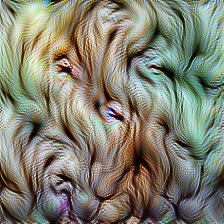

final loss: -17.674


In [3]:
from lucent_video.optvis import render, param, transform, objectives

param_f = lambda: param.image(224)
#obj = layer+':'+str(unit)
obj = objectives.channel(layer,unit)
_ = render.render_vis(model, obj, param_f, show_inline=True, thresholds = (100,))

[184, 2217, 4249, 6282, 8314, 10347, 12379, 14411, 16444, 18476]
184


100%|██████████| 100/100 [00:01<00:00, 67.59it/s]



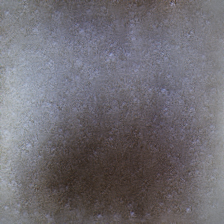
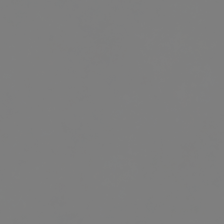

  9%|▉         | 9/100 [00:00<00:01, 87.51it/s]

final loss: -2.047
2217


100%|██████████| 100/100 [00:01<00:00, 74.05it/s]



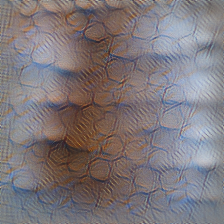
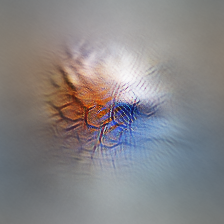

  7%|▋         | 7/100 [00:00<00:01, 65.59it/s]

final loss: -3.220
4249


100%|██████████| 100/100 [00:01<00:00, 66.89it/s]



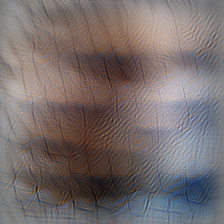
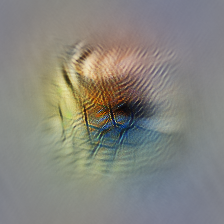

  7%|▋         | 7/100 [00:00<00:01, 68.88it/s]

final loss: -3.740
6282


100%|██████████| 100/100 [00:01<00:00, 69.46it/s]



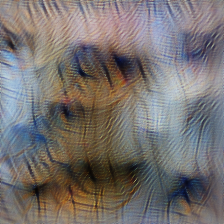
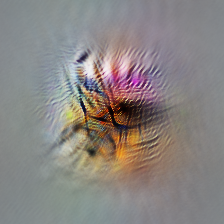

  7%|▋         | 7/100 [00:00<00:01, 69.08it/s]

final loss: -11.433
8314


100%|██████████| 100/100 [00:01<00:00, 69.17it/s]



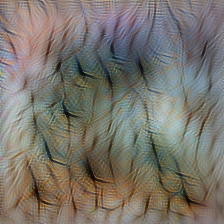
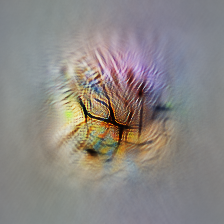

  8%|▊         | 8/100 [00:00<00:01, 70.36it/s]

final loss: -17.697
10347


100%|██████████| 100/100 [00:01<00:00, 70.10it/s]



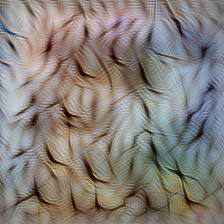
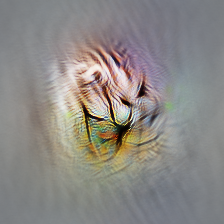

  7%|▋         | 7/100 [00:00<00:01, 68.92it/s]

final loss: -27.264
12379


100%|██████████| 100/100 [00:01<00:00, 68.84it/s]



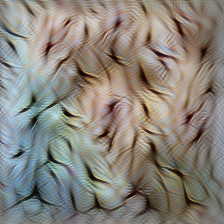
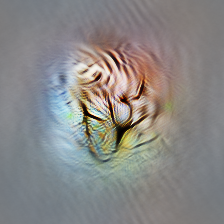

  7%|▋         | 7/100 [00:00<00:01, 68.11it/s]

final loss: -36.507
14411


100%|██████████| 100/100 [00:01<00:00, 65.87it/s]



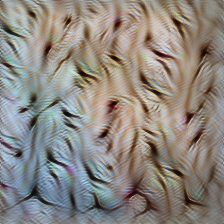
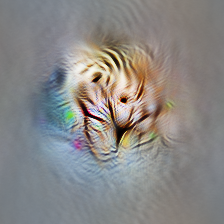

  7%|▋         | 7/100 [00:00<00:01, 64.57it/s]

final loss: -43.403
16444


100%|██████████| 100/100 [00:01<00:00, 65.07it/s]



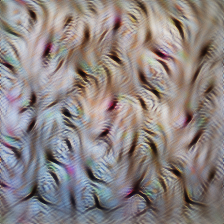
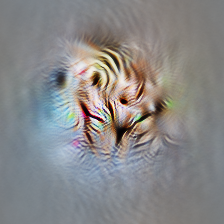

  7%|▋         | 7/100 [00:00<00:01, 68.31it/s]

final loss: -48.815
18476


100%|██████████| 100/100 [00:01<00:00, 65.35it/s]



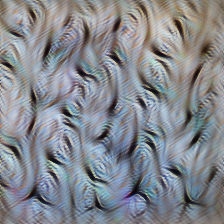
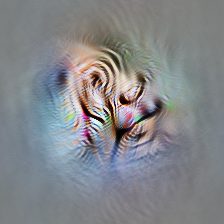

final loss: -50.459


In [7]:


image_list = gen_feature_viz_video(model,ranks,layer,unit,sparsity_range=(.001,.1),frames=10,opt_steps=100,
                                    file_name='test_linear.gif',scheduler='linear',connected=True, negatives=False,
                                    save=False,include_full=False, random_mask=False)







In [9]:
inputs = np.concatenate(image_list, axis=0)

setup_net_for_circuit_prune(model, feature_targets={layer:[unit]},save_target_activations=True)


features_10 effective last layer


NameError: name 'feature_target' is not defined

  6%|▌         | 6/100 [00:00<00:01, 59.56it/s]

[184, 2119, 4055, 5990, 7925, 9860, 11795, 13731, 15666, 17601, 19536, 21471, 23407, 25342, 27277, 29212, 31147, 33083, 35018, 36953]
184


100%|██████████| 100/100 [00:01<00:00, 57.56it/s]



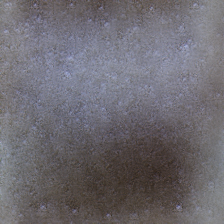
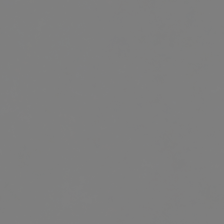

  6%|▌         | 6/100 [00:00<00:01, 56.02it/s]

final loss: -2.047
2119


100%|██████████| 100/100 [00:01<00:00, 56.67it/s]



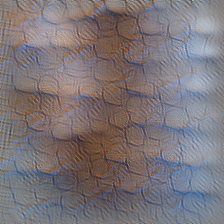
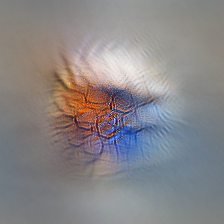

  6%|▌         | 6/100 [00:00<00:01, 58.15it/s]

final loss: -3.635
4055


100%|██████████| 100/100 [00:01<00:00, 58.41it/s]



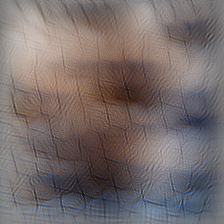
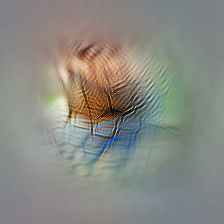

  6%|▌         | 6/100 [00:00<00:01, 59.42it/s]

final loss: -4.757
5990


100%|██████████| 100/100 [00:01<00:00, 53.37it/s]



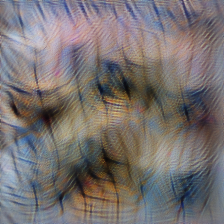
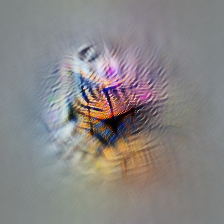

  6%|▌         | 6/100 [00:00<00:01, 51.02it/s]

final loss: -12.359
7925


100%|██████████| 100/100 [00:01<00:00, 52.78it/s]



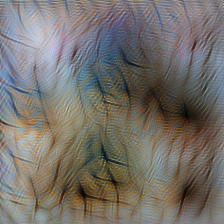
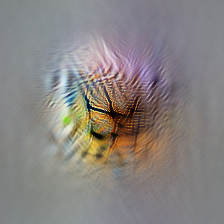

  6%|▌         | 6/100 [00:00<00:01, 50.69it/s]

final loss: -16.626
9860


100%|██████████| 100/100 [00:01<00:00, 51.83it/s]



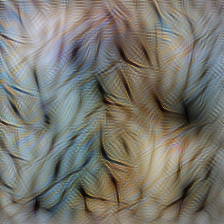
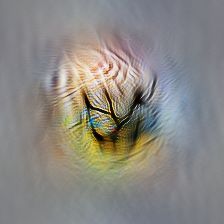

  6%|▌         | 6/100 [00:00<00:01, 51.56it/s]

final loss: -17.980
11795


100%|██████████| 100/100 [00:01<00:00, 50.65it/s]



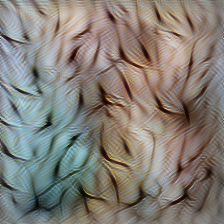
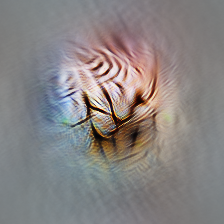

  6%|▌         | 6/100 [00:00<00:01, 51.02it/s]

final loss: -33.754
13731


100%|██████████| 100/100 [00:01<00:00, 51.74it/s]



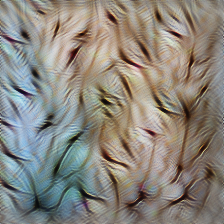
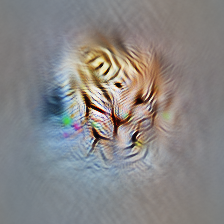

  6%|▌         | 6/100 [00:00<00:01, 50.45it/s]

final loss: -42.861
15666


100%|██████████| 100/100 [00:01<00:00, 57.28it/s]



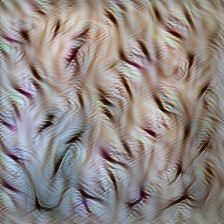
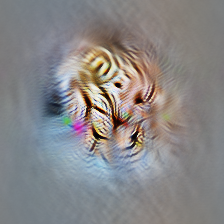

  6%|▌         | 6/100 [00:00<00:01, 57.37it/s]

final loss: -53.872
17601


100%|██████████| 100/100 [00:01<00:00, 57.83it/s]



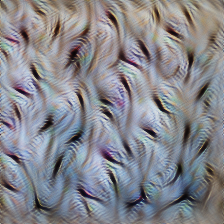
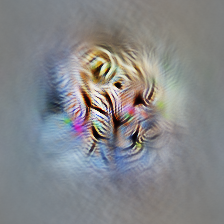

  6%|▌         | 6/100 [00:00<00:01, 58.12it/s]

final loss: -53.144
19536


100%|██████████| 100/100 [00:01<00:00, 58.42it/s]



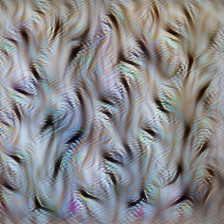
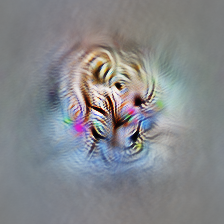

  6%|▌         | 6/100 [00:00<00:01, 59.58it/s]

final loss: -50.655
21471


100%|██████████| 100/100 [00:01<00:00, 60.41it/s]



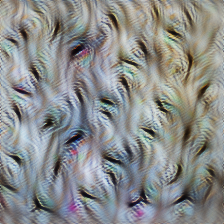
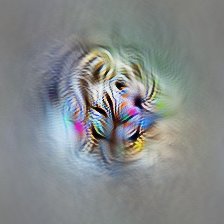

  6%|▌         | 6/100 [00:00<00:01, 57.87it/s]

final loss: -58.872
23407


100%|██████████| 100/100 [00:01<00:00, 58.09it/s]



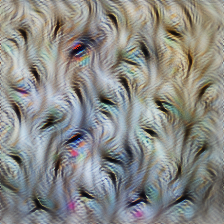
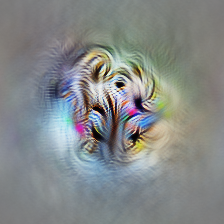

  6%|▌         | 6/100 [00:00<00:01, 58.24it/s]

final loss: -55.575
25342


100%|██████████| 100/100 [00:01<00:00, 53.20it/s]



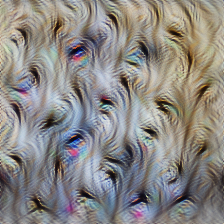
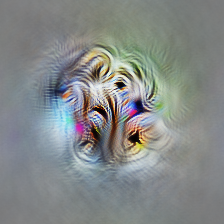

  6%|▌         | 6/100 [00:00<00:01, 50.24it/s]

final loss: -59.583
27277


100%|██████████| 100/100 [00:01<00:00, 55.27it/s]



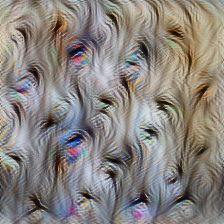
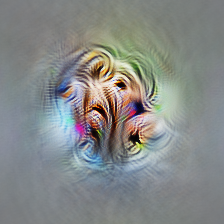

  6%|▌         | 6/100 [00:00<00:01, 57.95it/s]

final loss: -75.015
29212


100%|██████████| 100/100 [00:01<00:00, 58.15it/s]



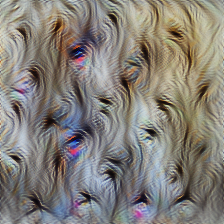
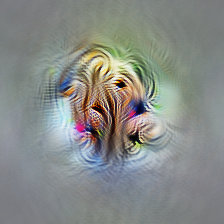

  7%|▋         | 7/100 [00:00<00:01, 59.95it/s]

final loss: -66.882
31147


100%|██████████| 100/100 [00:01<00:00, 58.29it/s]



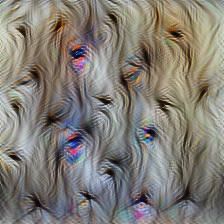
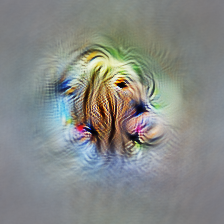

  6%|▌         | 6/100 [00:00<00:01, 56.42it/s]

final loss: -63.384
33083


100%|██████████| 100/100 [00:01<00:00, 58.02it/s]



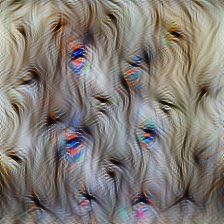
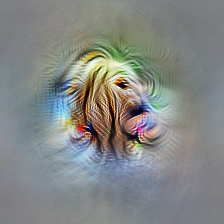

  6%|▌         | 6/100 [00:00<00:01, 57.94it/s]

final loss: -73.728
35018


100%|██████████| 100/100 [00:01<00:00, 58.18it/s]



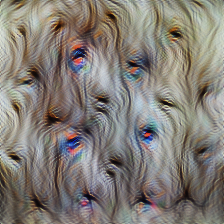
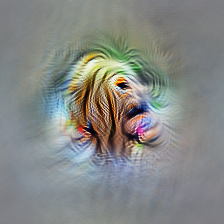

  6%|▌         | 6/100 [00:00<00:01, 58.79it/s]

final loss: -74.336
36953


100%|██████████| 100/100 [00:01<00:00, 57.70it/s]



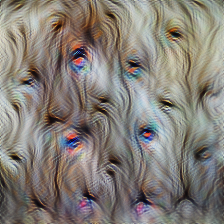
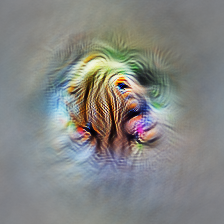

final loss: -77.598


In [40]:
image_list = gen_feature_viz_video(model,ranks,layer,unit,sparsity_range=(.001,.2),frames=20,opt_steps=100,
                                    file_name='test_linear.gif',scheduler='linear',connected=True, negatives=False,
                                    save=False,include_full=False, random_mask=False)



In [ ]:
from lucent_video.optvis.render import *


param_f = lambda: param.image(128,device=device)
params, image_f = param_f()

hook = hook_model(model, image_f)
transforms = transform.standard_transforms
transform_f = transform.compose(transforms)

_ = model(transform_f(image_f()))

hook(layer)

In [36]:
hook(layer)[:,unit,:,:]

tensor([[[0.9421, 0.9978, 1.0009, 1.0020, 1.0018, 1.0013, 1.0004, 0.9983,
          0.9272],
         [0.9451, 1.0312, 1.0347, 1.0362, 1.0361, 1.0358, 1.0351, 1.0338,
          0.9879],
         [0.9453, 1.0304, 1.0331, 1.0345, 1.0344, 1.0344, 1.0340, 1.0334,
          0.9884],
         [0.9464, 1.0313, 1.0335, 1.0347, 1.0346, 1.0346, 1.0343, 1.0338,
          0.9887],
         [0.9468, 1.0316, 1.0335, 1.0346, 1.0345, 1.0346, 1.0343, 1.0337,
          0.9885],
         [0.9474, 1.0320, 1.0336, 1.0346, 1.0345, 1.0345, 1.0342, 1.0336,
          0.9885],
         [0.9459, 1.0300, 1.0315, 1.0325, 1.0324, 1.0324, 1.0321, 1.0313,
          0.9871],
         [0.9422, 1.0250, 1.0269, 1.0285, 1.0284, 1.0283, 1.0279, 1.0267,
          0.9835],
         [0.8414, 0.9132, 0.9151, 0.9170, 0.9169, 0.9168, 0.9165, 0.9157,
          0.8828]]], device='cuda:0', grad_fn=<SliceBackward>)

In [32]:
layer

'features_10'

![SegmentLocal](features_10_230_linear.gif "segment")

![SegmentLocal](features_10_230_exp.gif "segment")

![SegmentLocal](features_10_230_linear.gif "segment")

![SegmentLocal](fur_100_steps.gif "segment")

![SegmentLocal](fur_phased.gif "segment")

![SegmentLocal](features_10:230__paint.gif "segment")

In [ ]:
from lucent_video.misc.io import show

show(image_list[40][0])

In [ ]:
im = Image.fromarray(np.uint8(image_list[40][0][0]*255))
display(im)

In [ ]:
from PIL import Image

name = '%s_%s_paint.gif'%(layer,unit)

gif = []
images = []#images, just convert it into PIL.Image obj
for image in image_list:
    im = im = Image.fromarray(np.uint8(image[0][0]*255))
    gif.append(im)
gif[0].save(name, save_all=True,optimize=False, append_images=gif[1:], loop=0)

In [ ]:
print(name)

![SegmentLocal](features_6_305_paint.gif "segment")


![SegmentLocal](featureviz_videos/alexnet_sparse/features_10_162_linear.gif "segment")

In [ ]:
features_10_162_linear.gif  _features_3_38_linear.gif  features_3_38_linear.gif  features_8_248_linear.gif  features_8_253_linear.gif

![SegmentLocal](featureviz_videos/alexnet_sparse/features_8_248_linear.gif "segment")

![SegmentLocal](featureviz_videos/alexnet_sparse/features_8_253_linear.gif "segment")

In [ ]:
from lucent_video.optvis import render, param, transform, objectives
#from lucent_video.modelzoo import inceptionv1
#param_f = lambda: param.image(size)

total_viz_steps = 200
within_viz_steps = 5

image_list = []
params = None
for i in range(int(total_viz_steps/within_viz_steps)):
    param_f = lambda: param.image(224,start_params=params,magic=10)
    #param_f = lambda: param.image(224)
    image,params = render.render_vis(model, obj_c, param_f, show_inline=True, thresholds=(within_viz_steps,))
    image_list.append(image)


In [ ]:
from PIL import Image

name = '%s_%s_render.gif'%(layer,unit)

gif = []
images = []#images, just convert it into PIL.Image obj
for image in image_list:
    im = im = Image.fromarray(np.uint8(image[0][0]*255))
    gif.append(im)
gif[0].save(name, save_all=True,optimize=False, append_images=gif[1:], loop=0)

In [ ]:
print(name)

In [ ]:
import os
os.listdir('/mnt/data/chris/dropbox/Research-Hamblin/Projects/circuit_pruner/circuit_ranks/alexnet_sparse/imagenet_2/actxgrad')

![SegmentLocal](features_6_305_render.gif "segment")

In [3]:
#hardware
device = 'cuda:0'

from circuit_pruner.utils import load_config
from circuit_pruner import root_path

config = load_config('./configs/inception_config.py')
model = config.model.to(device)



#general
import torch
import os
from copy import deepcopy
import torch.utils.data as data
from circuit_pruner.data_loading import rank_image_data
from circuit_pruner.force import *
from circuit_pruner.custom_exceptions import TargetReached

/home/chris/miniconda3/envs/viscnn/lib/python3.7/site-packages/torch/cuda/__init__.py:125: UserWarning: 
Tesla K40c with CUDA capability sm_35 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_61 sm_70 sm_75 compute_37.
If you want to use the Tesla K40c GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


In [1]:
'rnj:fji'.split(':')

['rnj', 'fji']

In [ ]:
from lucent.modelzoo.util import get_model_layers
get_model_layers(model)

In [22]:
from circuit_pruner.utils import show_model_layer_names

layers = show_model_layer_names(model)

All Layers:

conv2d0_pre_relu_conv
conv2d1_pre_relu_conv
conv2d2_pre_relu_conv
mixed3a_1x1_pre_relu_conv
mixed3a_3x3_bottleneck_pre_relu_conv
mixed3a_5x5_bottleneck_pre_relu_conv
mixed3a_pool_reduce_pre_relu_conv
mixed3a_3x3_pre_relu_conv
mixed3a_5x5_pre_relu_conv
mixed3b_1x1_pre_relu_conv
mixed3b_3x3_bottleneck_pre_relu_conv
mixed3b_5x5_bottleneck_pre_relu_conv
mixed3b_pool_reduce_pre_relu_conv
mixed3b_3x3_pre_relu_conv
mixed3b_5x5_pre_relu_conv
mixed4a_1x1_pre_relu_conv
mixed4a_3x3_bottleneck_pre_relu_conv
mixed4a_5x5_bottleneck_pre_relu_conv
mixed4a_pool_reduce_pre_relu_conv
mixed4a_3x3_pre_relu_conv
mixed4a_5x5_pre_relu_conv
mixed4b_1x1_pre_relu_conv
mixed4b_3x3_bottleneck_pre_relu_conv
mixed4b_5x5_bottleneck_pre_relu_conv
mixed4b_pool_reduce_pre_relu_conv
mixed4b_3x3_pre_relu_conv
mixed4b_5x5_pre_relu_conv
mixed4c_1x1_pre_relu_conv
mixed4c_3x3_bottleneck_pre_relu_conv
mixed4c_5x5_bottleneck_pre_relu_conv
mixed4c_pool_reduce_pre_relu_conv
mixed4c_3x3_pre_relu_conv
mixed4c_5x5_pre_r

In [19]:
#layer = 'mixed4e_3x3_pre_relu_conv'
#unit = 0
layer = "mixed4a"
unit = 465
rank_field = 'image'
method = 'snip'
data_path = config.data_path


kwargs = {'num_workers': 4, 'pin_memory': True, 'sampler':None} if 'cuda' in device else {}
label_file_path = config.label_file_path

dataloader = data.DataLoader(rank_image_data(data_path,
                                            config.preprocess,
                                            label_file_path = label_file_path,class_folders=True),
                                            batch_size=64,
                                            shuffle=False,
                                            **kwargs)

feature_target = {layer:[unit]}


    #generate weight mask with FORCE pruner
ranks = circuit_snip_rank(model, dataloader, feature_targets = feature_target,
                                full_dataset = True, 
                                device=device, rank_field= rank_field, mask=None)

for i in range(len(ranks)):
    ranks[i] = ranks[i].to('cpu')

No effective last layer found!


AttributeError: 'NoneType' object has no attribute 'backward'

  0%|          | 0/50 [00:00<?, ?it/s]

[2694, 62277, 121861, 181444, 241027, 300610, 360194, 419777, 479360, 538944, tensor(2694720)]
2694


100%|██████████| 50/50 [00:03<00:00, 12.52it/s]



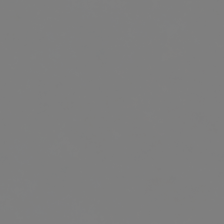
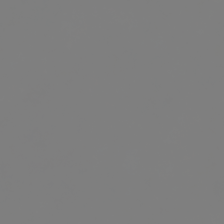
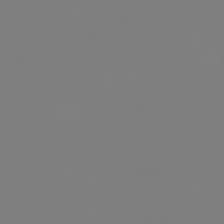
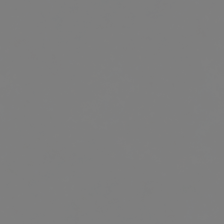

  0%|          | 0/50 [00:00<?, ?it/s]

62277


100%|██████████| 50/50 [00:04<00:00, 11.92it/s]



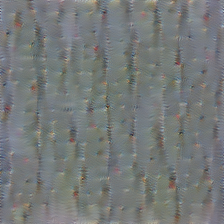
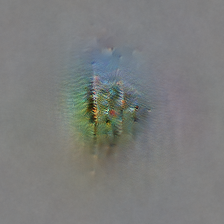
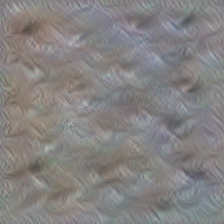
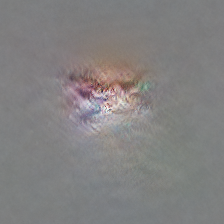

  0%|          | 0/50 [00:00<?, ?it/s]

121861


100%|██████████| 50/50 [00:04<00:00, 11.91it/s]



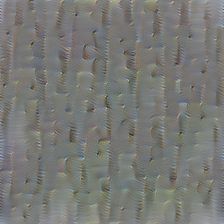
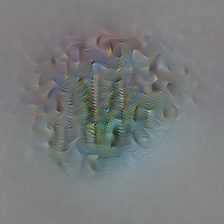
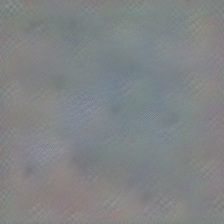
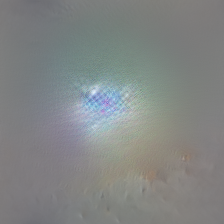

  0%|          | 0/50 [00:00<?, ?it/s]

181444


100%|██████████| 50/50 [00:04<00:00, 11.92it/s]



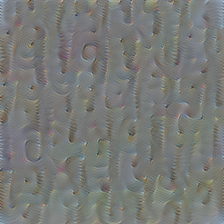
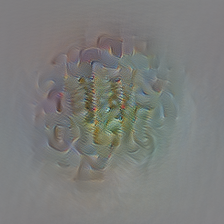
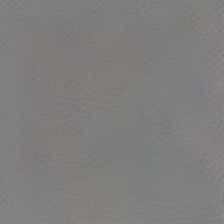
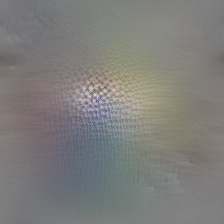

  0%|          | 0/50 [00:00<?, ?it/s]

241027


100%|██████████| 50/50 [00:04<00:00, 11.73it/s]



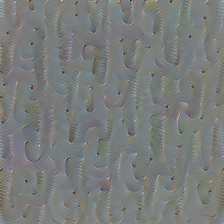
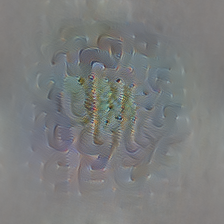
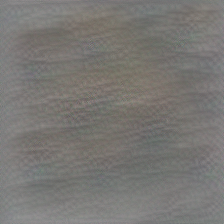
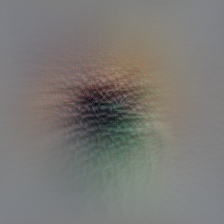

  0%|          | 0/50 [00:00<?, ?it/s]

300610


100%|██████████| 50/50 [00:04<00:00, 11.85it/s]



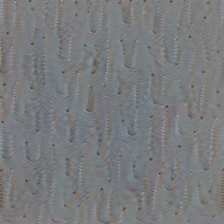
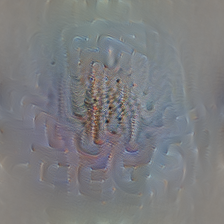
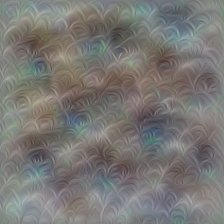
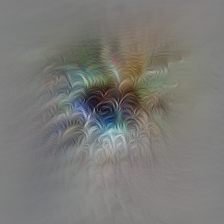

  0%|          | 0/50 [00:00<?, ?it/s]

360194


100%|██████████| 50/50 [00:04<00:00, 11.80it/s]



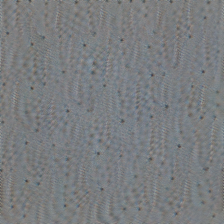
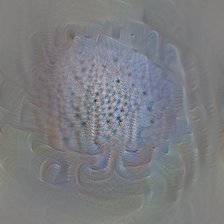
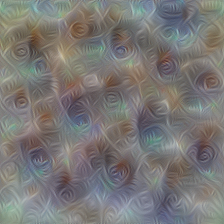
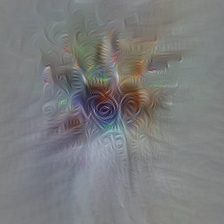

  0%|          | 0/50 [00:00<?, ?it/s]

419777


100%|██████████| 50/50 [00:04<00:00, 11.68it/s]



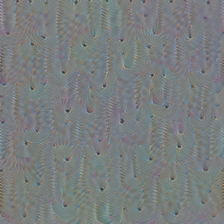
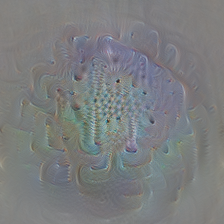
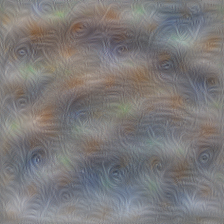
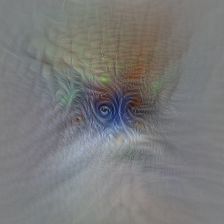

  0%|          | 0/50 [00:00<?, ?it/s]

479360


100%|██████████| 50/50 [00:04<00:00, 11.73it/s]



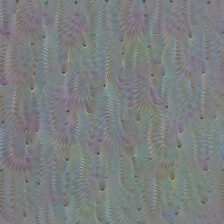
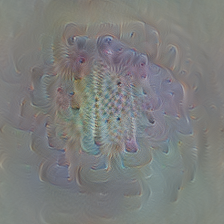
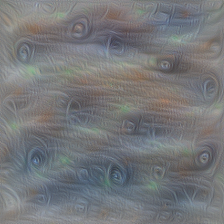
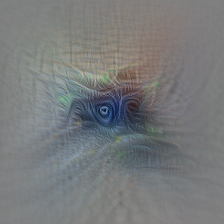

  0%|          | 0/50 [00:00<?, ?it/s]

538944


100%|██████████| 50/50 [00:04<00:00, 11.66it/s]



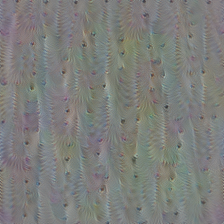
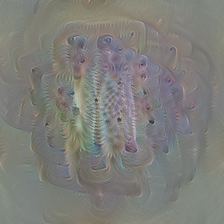
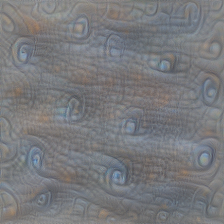
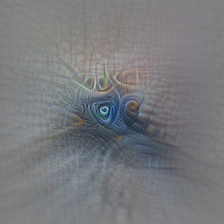

tensor(2694720)


100%|██████████| 50/50 [00:04<00:00, 11.51it/s]



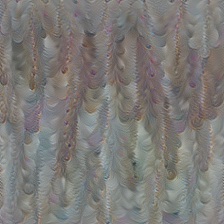
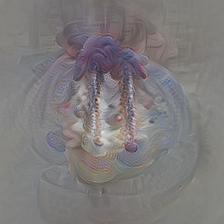
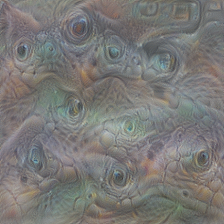
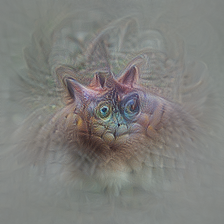

saving gif to inception_test.gif


In [18]:
image_list = gen_feature_viz_video(model,ranks,layer,unit,sparsity_range=(.001,.2),frames=10,opt_steps=50,
                            file_name='inception_test.gif',scheduler='linear',connected=True, negatives=True,save=True)


![SegmentLocal](inception_test.gif "segment")

In [25]:
def tensor_to_img_array(tensor):
    image = tensor.cpu().detach().numpy()
    image = np.transpose(image, [0, 2, 3, 1])
    return image


def view(tensor):
    image = tensor_to_img_array(tensor)
    assert len(image.shape) in [
        3,
        4,
    ], "Image should have 3 or 4 dimensions, invalid image shape {}".format(image.shape)
    # Change dtype for PIL.Image
    image = (image * 255).astype(np.uint8)
    if len(image.shape) == 4:
        image = np.concatenate(image, axis=1)
    Image.fromarray(image).show()


def export(tensor, image_name=None):
    image_name = image_name or "image.jpg"
    image = tensor_to_img_array(tensor)
    assert len(image.shape) in [
        3,
        4,
    ], "Image should have 3 or 4 dimensions, invalid image shape {}".format(image.shape)
    # Change dtype for PIL.Image
    image = (image * 255).astype(np.uint8)
    if len(image.shape) == 4:
        image = np.concatenate(image, axis=1)
    Image.fromarray(image).save(image_name)


class ModuleHook:
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
        self.module = None
        self.features = None

    def hook_fn(self, module, input, output):
        self.module = module
        self.features = output

    def close(self):
        self.hook.remove()


def hook_model(model, image_f):
    features = OrderedDict()

    # recursive hooking function
    def hook_layers(net, prefix=[]):
        if hasattr(net, "_modules"):
            for name, layer in net._modules.items():
                if layer is None:
                    # e.g. GoogLeNet's aux1 and aux2 layers
                    continue
                features["_".join(prefix + [name])] = ModuleHook(layer)
                hook_layers(layer, prefix=prefix + [name])

    hook_layers(model)

    def hook(layer):
        if layer == "input":
            out = image_f()
        elif layer == "labels":
            out = list(features.values())[-1].features
        else:
            assert layer in features, f"Invalid layer {layer}. Retrieve the list of layers with `lucent_video.modelzoo.util.get_model_layers(model)`."
            out = features[layer].features
        assert out is not None, "There are no saved feature maps. Make sure to put the model in eval mode, like so: `model.to(device).eval()`. See README for example."
        return out

    return hook

  1%|          | 3/512 [00:00<00:24, 20.45it/s]

tensor(-0.0890, device='cuda:0', grad_fn=<NegBackward>)
tensor(-0.8637, device='cuda:0', grad_fn=<NegBackward>)
tensor(-189.0560, device='cuda:0', grad_fn=<NegBackward>)
tensor(-355.0645, device='cuda:0', grad_fn=<NegBackward>)
tensor(-659.7894, device='cuda:0', grad_fn=<NegBackward>)


  2%|▏         | 9/512 [00:00<00:22, 22.46it/s]

tensor(-676.6420, device='cuda:0', grad_fn=<NegBackward>)
tensor(-922.9979, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1199.4716, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1273.2330, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1269.4783, device='cuda:0', grad_fn=<NegBackward>)


  3%|▎         | 15/512 [00:00<00:21, 22.62it/s]

tensor(-1585.8875, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1598.9614, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1724.9091, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1926.2565, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1896.6840, device='cuda:0', grad_fn=<NegBackward>)


  4%|▎         | 18/512 [00:00<00:22, 22.43it/s]

tensor(-2105.1936, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2207.2175, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1906.0448, device='cuda:0', grad_fn=<NegBackward>)
tensor(-1889.2277, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2370.7686, device='cuda:0', grad_fn=<NegBackward>)


  5%|▍         | 24/512 [00:01<00:21, 22.59it/s]

tensor(-2144.1233, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2193.1968, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2495.6150, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2147.4490, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2473.9363, device='cuda:0', grad_fn=<NegBackward>)


  6%|▌         | 30/512 [00:01<00:21, 22.60it/s]

tensor(-2605.5930, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2708.0613, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2588.4375, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2565.8904, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2847.7263, device='cuda:0', grad_fn=<NegBackward>)


  6%|▋         | 33/512 [00:01<00:21, 22.73it/s]

tensor(-2953.4214, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2899.4573, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2598.9761, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2870.2625, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3174.3948, device='cuda:0', grad_fn=<NegBackward>)


  8%|▊         | 39/512 [00:01<00:20, 22.91it/s]

tensor(-2935.2339, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3030.4041, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2514.7634, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2846.3494, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3286.2927, device='cuda:0', grad_fn=<NegBackward>)


  9%|▉         | 45/512 [00:01<00:20, 22.72it/s]

tensor(-2649.4504, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3237.9941, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3169.7607, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3113.5293, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2960.8428, device='cuda:0', grad_fn=<NegBackward>)


  9%|▉         | 48/512 [00:02<00:20, 22.21it/s]

tensor(-3184.1665, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3209.5503, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3009.7542, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3027.5718, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3140.8638, device='cuda:0', grad_fn=<NegBackward>)


 11%|█         | 54/512 [00:02<00:20, 22.41it/s]

tensor(-3080.4307, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2825.5188, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3021.7065, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2946.8354, device='cuda:0', grad_fn=<NegBackward>)
tensor(-2824.8557, device='cuda:0', grad_fn=<NegBackward>)


 12%|█▏        | 60/512 [00:02<00:20, 22.41it/s]

tensor(-3033.3210, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3603.1782, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3383.1072, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3464.4421, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3048.1775, device='cuda:0', grad_fn=<NegBackward>)


 12%|█▏        | 63/512 [00:02<00:19, 22.67it/s]

tensor(-3084.2629, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3566.6360, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3419.8750, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3382.5166, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3061.3860, device='cuda:0', grad_fn=<NegBackward>)


 13%|█▎        | 69/512 [00:03<00:19, 22.29it/s]

tensor(-2908.2000, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3566.1270, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3023.9260, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3362.1306, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3815.5212, device='cuda:0', grad_fn=<NegBackward>)


 15%|█▍        | 75/512 [00:03<00:19, 22.25it/s]

tensor(-3168.2388, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3356.0012, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3308.1389, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3562.6604, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3767.6606, device='cuda:0', grad_fn=<NegBackward>)


 15%|█▌        | 78/512 [00:03<00:19, 22.32it/s]

tensor(-3613.3723, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3580.5234, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3356.0293, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3906.4661, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3447.1531, device='cuda:0', grad_fn=<NegBackward>)


 16%|█▋        | 84/512 [00:03<00:19, 22.47it/s]

tensor(-3862.9004, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3799.3235, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3421.4114, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3387.6411, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3859.7371, device='cuda:0', grad_fn=<NegBackward>)


 18%|█▊        | 90/512 [00:04<00:18, 22.49it/s]

tensor(-3837.9307, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3959.9609, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3420.2900, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3016.0999, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3364.4807, device='cuda:0', grad_fn=<NegBackward>)


 18%|█▊        | 93/512 [00:04<00:18, 22.27it/s]

tensor(-3946.5054, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3652.2271, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3960.1323, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3768.0845, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3516.0459, device='cuda:0', grad_fn=<NegBackward>)


 19%|█▉        | 99/512 [00:04<00:18, 21.86it/s]

tensor(-3603.9106, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3940.5396, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3225.6660, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3332.1104, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3796.5784, device='cuda:0', grad_fn=<NegBackward>)


 21%|██        | 105/512 [00:04<00:18, 21.68it/s]

tensor(-3797.5676, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3019.5708, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3991.2231, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3695.4270, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3564.9624, device='cuda:0', grad_fn=<NegBackward>)


 21%|██        | 108/512 [00:04<00:18, 21.73it/s]

tensor(-3847.6670, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3668.7661, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3721.8423, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3481.8010, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4089.0713, device='cuda:0', grad_fn=<NegBackward>)


 22%|██▏       | 114/512 [00:05<00:18, 21.43it/s]

tensor(-3968.0295, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3842.5808, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3586.7566, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4141.7070, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3523.7891, device='cuda:0', grad_fn=<NegBackward>)


 23%|██▎       | 120/512 [00:05<00:18, 21.28it/s]

tensor(-4034.9387, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3763.0171, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3614.8950, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3269.3484, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3855.7937, device='cuda:0', grad_fn=<NegBackward>)


 24%|██▍       | 123/512 [00:05<00:18, 21.20it/s]

tensor(-3731.5593, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3572.0220, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3731.8950, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3487.0325, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3546.3125, device='cuda:0', grad_fn=<NegBackward>)


 25%|██▌       | 129/512 [00:05<00:17, 21.40it/s]

tensor(-3983.3262, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4017.8367, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3987.8818, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3633.3960, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4083.8735, device='cuda:0', grad_fn=<NegBackward>)


 26%|██▋       | 135/512 [00:06<00:17, 21.20it/s]

tensor(-4122.4531, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3815.1140, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3262.6323, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3765.0530, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3784.7932, device='cuda:0', grad_fn=<NegBackward>)


 27%|██▋       | 138/512 [00:06<00:17, 21.40it/s]

tensor(-4257.9248, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3895.3635, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3658.2659, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4185.5171, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4126.6523, device='cuda:0', grad_fn=<NegBackward>)


 28%|██▊       | 144/512 [00:06<00:17, 21.18it/s]

tensor(-3294.1555, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3678.0583, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4317.6880, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3963.2881, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3290.4639, device='cuda:0', grad_fn=<NegBackward>)


 29%|██▉       | 150/512 [00:06<00:17, 21.16it/s]

tensor(-4155.1431, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3719.5356, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4253.2104, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4380.6348, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3693.9412, device='cuda:0', grad_fn=<NegBackward>)


 30%|██▉       | 153/512 [00:06<00:16, 21.46it/s]

tensor(-3350.8137, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3803.4390, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4120.7808, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3820.6628, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3704.5332, device='cuda:0', grad_fn=<NegBackward>)


 31%|███       | 159/512 [00:07<00:16, 21.59it/s]

tensor(-3555.2776, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3538.5740, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3841.8335, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4055.6750, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3948.9324, device='cuda:0', grad_fn=<NegBackward>)


 32%|███▏      | 165/512 [00:07<00:15, 21.72it/s]

tensor(-3484.5657, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3998.2485, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4123.9570, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3943.0203, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4113.5166, device='cuda:0', grad_fn=<NegBackward>)


 33%|███▎      | 168/512 [00:07<00:15, 21.71it/s]

tensor(-3986.6548, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3621.5420, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4072.8025, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3225.8655, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4264.8726, device='cuda:0', grad_fn=<NegBackward>)


 34%|███▍      | 174/512 [00:07<00:15, 21.60it/s]

tensor(-3892.4246, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3598.2563, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3585.2920, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4053.1160, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3728.0879, device='cuda:0', grad_fn=<NegBackward>)


 35%|███▌      | 180/512 [00:08<00:15, 21.50it/s]

tensor(-4317.9727, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3329.8689, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4151.6934, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4171.7671, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3534.0522, device='cuda:0', grad_fn=<NegBackward>)


 36%|███▌      | 183/512 [00:08<00:15, 21.33it/s]

tensor(-4090.2751, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4227.2554, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3968.1750, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3475.9834, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4131.0767, device='cuda:0', grad_fn=<NegBackward>)


 37%|███▋      | 189/512 [00:08<00:15, 21.22it/s]

tensor(-3952.6077, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3772.5891, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3828.8379, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3726.1975, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4255.2622, device='cuda:0', grad_fn=<NegBackward>)


 38%|███▊      | 195/512 [00:08<00:14, 21.54it/s]

tensor(-4158.7275, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3667.0381, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4329.3706, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3721.2837, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3301.1475, device='cuda:0', grad_fn=<NegBackward>)


 39%|███▊      | 198/512 [00:09<00:14, 21.51it/s]

tensor(-4053.7688, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4153.7852, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3479.9900, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4117.2104, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3799.4426, device='cuda:0', grad_fn=<NegBackward>)


 40%|███▉      | 204/512 [00:09<00:14, 21.55it/s]

tensor(-3484.5198, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4287.4800, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3852.3816, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4112.0938, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3296.8755, device='cuda:0', grad_fn=<NegBackward>)


 41%|████      | 210/512 [00:09<00:13, 21.67it/s]

tensor(-3740.0254, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4196.7344, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3958.8401, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4394.1235, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4088.9719, device='cuda:0', grad_fn=<NegBackward>)


 42%|████▏     | 213/512 [00:09<00:13, 21.80it/s]

tensor(-4038.1750, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4057.3787, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4020.5784, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4129.7134, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4011.8640, device='cuda:0', grad_fn=<NegBackward>)


 43%|████▎     | 219/512 [00:10<00:13, 21.67it/s]

tensor(-4242.1895, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4253.0806, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4297.9204, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3874.7192, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4367.3413, device='cuda:0', grad_fn=<NegBackward>)


 44%|████▍     | 225/512 [00:10<00:13, 21.39it/s]

tensor(-4229.3320, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4369.9297, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4404.8081, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4147.1733, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3883.8193, device='cuda:0', grad_fn=<NegBackward>)


 45%|████▍     | 228/512 [00:10<00:13, 21.23it/s]

tensor(-3511.2451, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4170.9961, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3353.9436, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4094.0735, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3765.0430, device='cuda:0', grad_fn=<NegBackward>)


 46%|████▌     | 234/512 [00:10<00:13, 21.15it/s]

tensor(-4401.1616, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3488.4858, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3808.9006, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3993.1594, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3690.9973, device='cuda:0', grad_fn=<NegBackward>)


 47%|████▋     | 240/512 [00:11<00:12, 21.40it/s]

tensor(-4239.8145, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4172.4165, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4451.5083, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4006.3323, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4257.6523, device='cuda:0', grad_fn=<NegBackward>)


 47%|████▋     | 243/512 [00:11<00:12, 21.25it/s]

tensor(-3567.2734, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4133.5186, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4544.5508, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4081.3979, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3854.0483, device='cuda:0', grad_fn=<NegBackward>)


 49%|████▊     | 249/512 [00:11<00:12, 21.46it/s]

tensor(-4289.0747, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3928.2983, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3643.4307, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4142.5254, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3776.3730, device='cuda:0', grad_fn=<NegBackward>)


 50%|████▉     | 255/512 [00:11<00:11, 21.61it/s]

tensor(-4416.0732, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4392.9863, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4386.9092, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3909.8245, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4218.8892, device='cuda:0', grad_fn=<NegBackward>)


 50%|█████     | 258/512 [00:11<00:11, 21.42it/s]

tensor(-3807.4150, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4149.9517, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4328.4878, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4282.9292, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3568.9751, device='cuda:0', grad_fn=<NegBackward>)


 52%|█████▏    | 264/512 [00:12<00:11, 21.68it/s]

tensor(-4131.5303, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4031.7151, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3950.2000, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4296.2778, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4309.1826, device='cuda:0', grad_fn=<NegBackward>)


 53%|█████▎    | 270/512 [00:12<00:11, 21.29it/s]

tensor(-4492.9663, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3853.3462, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4284.8940, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4297.7578, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4466.1650, device='cuda:0', grad_fn=<NegBackward>)


 53%|█████▎    | 273/512 [00:12<00:11, 21.48it/s]

tensor(-3551.3928, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4182.4150, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4243.9556, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3581.7239, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3533.2275, device='cuda:0', grad_fn=<NegBackward>)


 54%|█████▍    | 279/512 [00:12<00:10, 21.52it/s]

tensor(-4069.5989, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4354.2603, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4349.7646, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3786.1931, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4067.0557, device='cuda:0', grad_fn=<NegBackward>)


 56%|█████▌    | 285/512 [00:13<00:10, 21.73it/s]

tensor(-4479.8081, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3865.9565, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4150.6797, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4051.0969, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4059.0669, device='cuda:0', grad_fn=<NegBackward>)


 56%|█████▋    | 288/512 [00:13<00:10, 21.52it/s]

tensor(-4244.3530, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4321.6479, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4414.4194, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4273.7812, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4489.9771, device='cuda:0', grad_fn=<NegBackward>)


 57%|█████▋    | 294/512 [00:13<00:10, 21.50it/s]

tensor(-4201.9551, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3817.5293, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4107.0322, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4521.5444, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4100.9087, device='cuda:0', grad_fn=<NegBackward>)


 59%|█████▊    | 300/512 [00:13<00:09, 21.59it/s]

tensor(-3344.4592, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4526.2397, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4408.4980, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4303.4023, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4377.7070, device='cuda:0', grad_fn=<NegBackward>)


 59%|█████▉    | 303/512 [00:13<00:09, 21.45it/s]

tensor(-4400.1367, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3846.5332, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4598.1118, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4022.3176, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3893.5076, device='cuda:0', grad_fn=<NegBackward>)


 60%|██████    | 309/512 [00:14<00:09, 21.58it/s]

tensor(-3745.9592, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4170.8301, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3836.8450, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4130.7759, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4364.4165, device='cuda:0', grad_fn=<NegBackward>)


 62%|██████▏   | 315/512 [00:14<00:09, 21.61it/s]

tensor(-3688.9985, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3501.6919, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4417.3174, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4190.9111, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4613.6279, device='cuda:0', grad_fn=<NegBackward>)


 62%|██████▏   | 318/512 [00:14<00:08, 21.62it/s]

tensor(-4500.0312, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3988.9451, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4263.0337, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4559.2021, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4230.5146, device='cuda:0', grad_fn=<NegBackward>)


 63%|██████▎   | 324/512 [00:14<00:08, 21.38it/s]

tensor(-4550.5874, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4031.6558, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3839.8438, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3329.1099, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3870.6582, device='cuda:0', grad_fn=<NegBackward>)


 64%|██████▍   | 330/512 [00:15<00:08, 21.47it/s]

tensor(-4173.9385, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3570.4526, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4170.5669, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4581.0239, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4201.9448, device='cuda:0', grad_fn=<NegBackward>)


 65%|██████▌   | 333/512 [00:15<00:08, 21.53it/s]

tensor(-4495.6113, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4516.2422, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4154.4663, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4661.5171, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4133.5498, device='cuda:0', grad_fn=<NegBackward>)


 66%|██████▌   | 339/512 [00:15<00:07, 21.73it/s]

tensor(-4551.9751, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4617.9688, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4521.4258, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3892.4285, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4119.6470, device='cuda:0', grad_fn=<NegBackward>)


 67%|██████▋   | 345/512 [00:15<00:07, 21.68it/s]

tensor(-4335.2959, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4231.4238, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4443.3750, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4040.7871, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3659.3857, device='cuda:0', grad_fn=<NegBackward>)


 68%|██████▊   | 348/512 [00:16<00:07, 21.62it/s]

tensor(-4018.2136, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4255.8120, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3885.8972, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4402.4434, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4581.7310, device='cuda:0', grad_fn=<NegBackward>)


 69%|██████▉   | 354/512 [00:16<00:07, 21.47it/s]

tensor(-4193.7749, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4491.5425, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4626.9697, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3877.4202, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4341.7759, device='cuda:0', grad_fn=<NegBackward>)


 70%|███████   | 360/512 [00:16<00:07, 21.20it/s]

tensor(-4025.8093, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4585.9731, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4369.5098, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4105.3262, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3476.8901, device='cuda:0', grad_fn=<NegBackward>)


 71%|███████   | 363/512 [00:16<00:07, 21.04it/s]

tensor(-4409.3281, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4145.5176, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3966.3047, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3939.8464, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3562.8701, device='cuda:0', grad_fn=<NegBackward>)


 72%|███████▏  | 369/512 [00:17<00:06, 21.39it/s]

tensor(-4528.2549, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4589.2090, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4002.5347, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4396.9038, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4646.8662, device='cuda:0', grad_fn=<NegBackward>)


 73%|███████▎  | 375/512 [00:17<00:06, 21.21it/s]

tensor(-4397.4678, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4547.8423, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3965.6052, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3271.2551, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4269.2173, device='cuda:0', grad_fn=<NegBackward>)


 74%|███████▍  | 378/512 [00:17<00:06, 21.43it/s]

tensor(-4276.9897, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4487.2944, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4624.0552, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3928.5190, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4375.8818, device='cuda:0', grad_fn=<NegBackward>)


 75%|███████▌  | 384/512 [00:17<00:05, 21.56it/s]

tensor(-4140.1816, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4478.2212, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4553.3662, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4677.0474, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3867.5745, device='cuda:0', grad_fn=<NegBackward>)


 76%|███████▌  | 390/512 [00:17<00:05, 21.77it/s]

tensor(-4417.6875, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4735.8926, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3742.8635, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3907.0107, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4716.7637, device='cuda:0', grad_fn=<NegBackward>)


 77%|███████▋  | 393/512 [00:18<00:05, 21.61it/s]

tensor(-4209.4922, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4258.4966, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4426.4634, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4158.8467, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4358.5210, device='cuda:0', grad_fn=<NegBackward>)


 78%|███████▊  | 399/512 [00:18<00:05, 21.64it/s]

tensor(-4533.6245, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4095.6125, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4578.8062, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3729.5156, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4223.0586, device='cuda:0', grad_fn=<NegBackward>)


 79%|███████▉  | 405/512 [00:18<00:04, 21.63it/s]

tensor(-4483.9092, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4601.8667, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4022.3960, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4574.0166, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4615.9736, device='cuda:0', grad_fn=<NegBackward>)


 80%|███████▉  | 408/512 [00:18<00:04, 21.54it/s]

tensor(-3979.4119, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4450.5669, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4217.3062, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4676.7583, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3879.7754, device='cuda:0', grad_fn=<NegBackward>)


 81%|████████  | 414/512 [00:19<00:04, 21.69it/s]

tensor(-4375.4214, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3949.0525, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4033.5554, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4643.9893, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3701.8608, device='cuda:0', grad_fn=<NegBackward>)


 82%|████████▏ | 420/512 [00:19<00:04, 22.29it/s]

tensor(-4370.6792, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4589.8027, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4478.7725, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4411.0308, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4541.2017, device='cuda:0', grad_fn=<NegBackward>)


 83%|████████▎ | 423/512 [00:19<00:03, 22.31it/s]

tensor(-3765.8943, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3943.5823, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4667.7686, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4321.9839, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4569.3291, device='cuda:0', grad_fn=<NegBackward>)


 84%|████████▍ | 429/512 [00:19<00:03, 22.73it/s]

tensor(-4097.0757, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3820.5134, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4352.6562, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4464.7114, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4075.9788, device='cuda:0', grad_fn=<NegBackward>)


 85%|████████▍ | 435/512 [00:20<00:03, 22.39it/s]

tensor(-4488.0342, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4397.4268, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3981.7207, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4305.7217, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4346.2188, device='cuda:0', grad_fn=<NegBackward>)


 86%|████████▌ | 438/512 [00:20<00:03, 22.14it/s]

tensor(-3887.5483, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4531.9780, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4550.2886, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4299.6006, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4633.2827, device='cuda:0', grad_fn=<NegBackward>)


 87%|████████▋ | 444/512 [00:20<00:03, 22.31it/s]

tensor(-4593.8892, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4270.8735, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4201.5791, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4265.1333, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4321.6362, device='cuda:0', grad_fn=<NegBackward>)


 88%|████████▊ | 450/512 [00:20<00:02, 22.27it/s]

tensor(-4766.9902, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4508.2798, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4379.1519, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4304.2427, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4747.9790, device='cuda:0', grad_fn=<NegBackward>)


 88%|████████▊ | 453/512 [00:20<00:02, 21.99it/s]

tensor(-4434.3101, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4278.1924, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4675.7695, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4695.2510, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4089.1760, device='cuda:0', grad_fn=<NegBackward>)


 90%|████████▉ | 459/512 [00:21<00:02, 22.15it/s]

tensor(-4529.6602, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4737.5991, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4434.8564, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4412.0811, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4438.3457, device='cuda:0', grad_fn=<NegBackward>)


 91%|█████████ | 465/512 [00:21<00:02, 22.15it/s]

tensor(-4478.2227, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3578.6223, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4425.9023, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4350.8457, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4308.6143, device='cuda:0', grad_fn=<NegBackward>)


 91%|█████████▏| 468/512 [00:21<00:01, 22.19it/s]

tensor(-3970.0671, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4467.6079, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3917.4275, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3840.2041, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4213.6416, device='cuda:0', grad_fn=<NegBackward>)


 93%|█████████▎| 474/512 [00:21<00:01, 22.25it/s]

tensor(-3896.2729, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4567.5830, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4550.4912, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4518.9683, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4668.1885, device='cuda:0', grad_fn=<NegBackward>)


 94%|█████████▍| 480/512 [00:22<00:01, 22.39it/s]

tensor(-4358.7417, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4610.6895, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4291.5059, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4387.4785, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4279.2573, device='cuda:0', grad_fn=<NegBackward>)


 94%|█████████▍| 483/512 [00:22<00:01, 22.40it/s]

tensor(-4217.5884, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4435.0576, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4689.5298, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4346.3936, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4047.7742, device='cuda:0', grad_fn=<NegBackward>)


 96%|█████████▌| 489/512 [00:22<00:01, 22.34it/s]

tensor(-4314.8350, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3792.5479, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4751.8945, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4234.6079, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3900.4441, device='cuda:0', grad_fn=<NegBackward>)


 97%|█████████▋| 495/512 [00:22<00:00, 22.39it/s]

tensor(-4013.6951, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4242.3530, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4749.1323, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3960.1511, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4727.7036, device='cuda:0', grad_fn=<NegBackward>)


 97%|█████████▋| 498/512 [00:22<00:00, 22.45it/s]

tensor(-4504.1636, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4596.4360, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3763.3398, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4581.6782, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3959.7832, device='cuda:0', grad_fn=<NegBackward>)


 98%|█████████▊| 504/512 [00:23<00:00, 21.96it/s]

tensor(-4564.0342, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4132.0298, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4459.3403, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4463.5776, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4046.7021, device='cuda:0', grad_fn=<NegBackward>)


100%|█████████▉| 510/512 [00:23<00:00, 22.26it/s]

tensor(-4396.3735, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4635.1040, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3876.9451, device='cuda:0', grad_fn=<NegBackward>)
tensor(-3702.2136, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4366.0977, device='cuda:0', grad_fn=<NegBackward>)


100%|██████████| 512/512 [00:23<00:00, 21.80it/s]

tensor(-4721.2021, device='cuda:0', grad_fn=<NegBackward>)
tensor(-4349.8984, device='cuda:0', grad_fn=<NegBackward>)



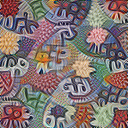

In [26]:
from lucent_video.optvis import render, param, transform, objectives
from lucent.modelzoo import inceptionv1
import torch
import warnings
from collections import OrderedDict
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch

from lucent_video.optvis import objectives, transform, param
from lucent_video.misc.io import show


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = inceptionv1(pretrained=True)
_ = model.to(device).eval()




objective_f = 'mixed4a:476'
optimizer=None
transforms=None
thresholds=(512,)
verbose=False
preprocess=True
progress=True
show_image=True
save_image=False
image_name=None
show_inline=False
fixed_image_size=None
start_params = None
return_params = False
device='cuda:0'

param_f = lambda: param.image(128,start_params=start_params,device=device)
# param_f is a function that should return two things
# params - parameters to update, which we pass to the optimizer
# image_f - a function that returns an image as a tensor
params, image_f = param_f()

if optimizer is None:
    optimizer = lambda params: torch.optim.Adam(params, lr=5e-2)
optimizer = optimizer(params)

if transforms is None:
    transforms = transform.standard_transforms
transforms = transforms.copy()

if preprocess:
    if model._get_name() == "InceptionV1":
        # Original Tensorflow InceptionV1 takes input range [-117, 138]
        transforms.append(transform.preprocess_inceptionv1())
    else:
        # Assume we use normalization for torchvision.models
        # See https://pytorch.org/docs/stable/torchvision/models.html
        transforms.append(transform.normalize())

# Upsample images smaller than 224
image_shape = image_f().shape
if fixed_image_size is not None:
    new_size = fixed_image_size
elif image_shape[2] < 224 or image_shape[3] < 224:
    new_size = 224
else:
    new_size = None
if new_size:
    transforms.append(
        torch.nn.Upsample(size=new_size, mode="bilinear", align_corners=True)
    )

transform_f = transform.compose(transforms)

hook = hook_model(model, image_f)
objective_f = objectives.as_objective(objective_f)



images = []
try:
    for i in tqdm(range(1, max(thresholds) + 1), disable=(not progress)):
        def closure():
            optimizer.zero_grad()
            try:
                model(transform_f(image_f()))
            except RuntimeError as ex:
                if i == 1:
                    # Only display the warning message
                    # on the first iteration, no need to do that
                    # every iteration
                    warnings.warn(
                        "Some layers could not be computed because the size of the "
                        "image is not big enough. It is fine, as long as the non"
                        "computed layers are not used in the objective function"
                        f"(exception details: '{ex}')"
                    )
            loss = objective_f(hook)
            loss.backward()
            print(loss)
            return loss

        optimizer.step(closure)
        if i in thresholds:
            image = tensor_to_img_array(image_f())
            if verbose:
                print("Loss at step {}: {:.3f}".format(i, objective_f(hook)))
                if show_inline:
                    show(image)
            images.append(image)
except KeyboardInterrupt:
    print("Interrupted optimization at step {:d}.".format(i))
    if verbose:
        print("Loss at step {}: {:.3f}".format(i, objective_f(hook)))
    images.append(tensor_to_img_array(image_f()))


show(tensor_to_img_array(image_f()))







In [64]:
image_f().grad

/home/chris/miniconda3/envs/viscnn/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  """Entry point for launching an IPython kernel.


In [ ]:
model(transform_f(image_f()))
print("Initial loss: {:.3f}".format(objective_f(hook)))

In [24]:
hook('mixed4a').shape

NameError: name 'hook' is not defined

In [45]:
import inspect

inspect.signature(hook)

<Signature (layer)>

In [21]:
x = (1,2,3)

In [22]:
x.append(4)

AttributeError: 'tuple' object has no attribute 'append'